In [7]:
import pandas as pd
import altair as alt
from matplotlib import pyplot as plt
from Commons.data_processing import get_files, iterate_contents
from Commons.DataProcessors.pd_processor import PDProcessor
from Commons.DataProcessors.byonic import categorize_glycan
from ntpath import basename, splitext
from modlamp.descriptors import PeptideDescriptor
from venn import venn
from Commons.data_processing import make_venn3
from matplotlib_venn import venn3
import re
import warnings
warnings.filterwarnings('ignore')

In [11]:
files = get_files(r'.\Reproducibility', exts=['.xlsx'])
files = [f for f in files if re.search('_1_', f)]
files

['.\\Reproducibility\\20210710_GlycEnr_1_30C_Run1-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_30C_Run2-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_30C_Run3-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_45C_Run1-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_45C_Run2-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_45C_Run3-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_60C_Run1-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_60C_Run2-(1).xlsx',
 '.\\Reproducibility\\20210710_GlycEnr_1_60C_Run3-(1).xlsx']

In [3]:
read_data = None
for file in files:
    name = splitext(basename(file))[0]
    name = name.split('-')[0]
    data = PDProcessor([file], name)
    temp, run = name.split('_')[3:]
    data.add_special_column('temperature', temp)
    data.add_special_column('run', run)

    if read_data is None:
        read_data = data
    else:
        read_data.join_processors(data)
read_data.alias_engine('')

In [4]:
peptides = read_data.peptides
peptides.modifications.fillna('', inplace=True)
peptides.glycan_composition = peptides.glycan_composition.fillna(0)

In [18]:
gp = peptides[(peptides.byonic_score > 200) & (peptides.glycan_composition!=0)]
gp.loc[:, 'seq_mods'] = ['_'.join([s, g]) for (s, g) in zip(gp.sequence, gp.modifications)]
gp.loc[:, 'glycan_type'] = gp.glycan_composition.map(categorize_glycan)

In [20]:
bars = (
    alt.Chart(gp[['temperature', 'seq_mods', 'run']])
    .mark_bar()
    .encode(
        x=alt.X("temperature:N", title="", axis=alt.Axis(labelAngle=-45)),
        y=alt.Y("mean(my_count):Q", title="Number Glycopeptide Matches"),
    )
    .transform_aggregate(
        my_count='count(seq_mods)',
        groupby=['temperature', 'run']
    )
)

err = (
    alt.Chart(gp[['temperature', 'seq_mods', 'run']])
    .mark_errorbar(color='black', extent='stdev')
    .encode(
        x=alt.X("temperature:N", title="", axis=alt.Axis(labelAngle=-45)),
        y=alt.Y("mean(my_count):Q", title="Number Glycopeptide Matches"),
    )
    .transform_aggregate(
        my_count='count(seq_mods)',
        groupby=['temperature', 'run']
    )
)
(bars + err).properties(title='Number Glycopeptides vs. Temperature').save('NumGlyc_PGC_Trip.svg')


In [21]:
glycan_color_scale = alt.Scale(
    domain=[
        'Sialylated',
        'Fucosylated',
        'Complex',
        'Paucimannose',
        'High Mannose',
    ],
    range=[
        '#6E6581',
        '#AF3A53',
        '#6B8A97',
        '#B0B2BB',
        '#658A64',
    ]
)

bars = alt.Chart(gp[['glycan_type', 'temperature', 'seq_mods']].drop_duplicates('seq_mods', keep=False)).mark_bar().encode(
    x=alt.X('count(glycan_type):Q', title='Count'),
    y=alt.Y('temperature:O', title=''),
    color=alt.Color('glycan_type:N', scale=glycan_color_scale)
) 
text = alt.Chart(gp[['glycan_type', 'temperature', 'seq_mods']].drop_duplicates('seq_mods', keep=False)).mark_text(dx=-10).encode(
    y=alt.Y('temperature:N', title=''),
    x=alt.X('count(glycan_type):Q', title='', stack='zero'),
    text=alt.Text('count(glycan_type):Q'),
    detail='glycan_type:N'
)

(bars + text).save('GlycanTypes_3Cols.svg')
(bars + text)

alt.LayerChart(...)

Text(0.5, 1.0, 'Glycopeptide Overlap by Temperature')

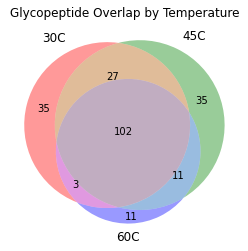

In [22]:
vals, names = make_venn3('seq_mods', 'temperature', gp)
venn3(vals, names)
plt.title('Glycopeptide Overlap by Temperature')

Text(0.5, 0.98, 'Protein Overlap')

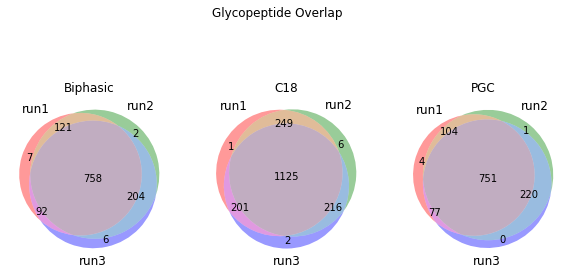

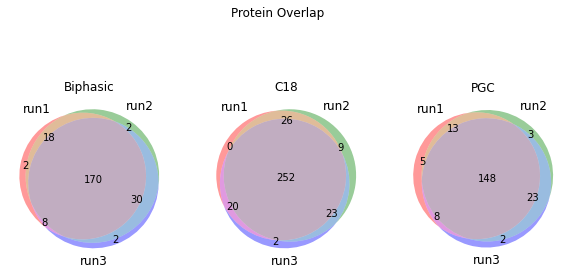

In [18]:
file = get_files(r'.\Reproducibility', exts=['.csv'])[0]
df = pd.read_csv(file)


fig, ax = plt.subplots(1, 3, figsize=(10, 5))

i = 0
for col, c_frame in iterate_contents('column', df, get_item=True):
    output = {}
    c_frame = c_frame[~c_frame.glycan_composition.isna()]
    nums, groups = make_venn3('seq_mods', 'run', c_frame)
    venn3(nums, groups, ax=ax[i])
    ax[i].set_title(col)
    i+=1
plt.suptitle('Glycopeptide Overlap')


fig, ax = plt.subplots(1, 3, figsize=(10,5))

i = 0
for col, c_frame in iterate_contents('column', df, get_item=True):
    output = {}
    nums, groups = make_venn3('accession', 'run', c_frame)
    venn3(nums, groups, ax=ax[i])
    ax[i].set_title(col)
    i+=1
plt.suptitle('Protein Overlap')


In [145]:
df.loc[:, 'peptide_length'] = df.sequence.map(lambda x: len(x))

# dom = {
#     [d for d in domain if re.search('PGC', d)][0]: '#cc7833',
#     [d for d in domain if re.search('BP', d)][0]: '#86858f',
#     [d for d in domain if re.search('C18', d)][0]: '#43648c'
# }

column_colors = alt.Color(
    'column:O',
    scale=alt.Scale(
        domain = ['Biphasic', 'C18', 'PGC'],
        range=['#86858f', '#43648c', '#cc7833']
    )
)

boxes = alt.Chart(df).mark_boxplot().encode(
    x=alt.X('run:O', title='', axis=alt.Axis(labelAngle=-60)),
    y=alt.Y('peptide_length:Q', title='Sequence Length'),
    column='column:N',
    color=column_colors
).properties(
    title='Peptide Length'
)
boxes

alt.Chart(...)

In [179]:
gravy = df[['sequence', 'accession', 'column', 'glycan_composition',
            'rt_min', 'mz_da', 'charge']]
gravy.loc[:, 'bin_min'] = gravy.rt_min // 10 * 10
def pour(s):
    desc = PeptideDescriptor(s, 'gravy')
    desc.calculate_global()
    return desc.descriptor[0][0]

gravy.loc[:, 'gravy'] = gravy.sequence.map(pour)

C:\Users\graha\AppData\Local\Programs\Python\Python38\lib\site-packages\pandas\core\indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\graha\AppData\Local\Programs\Python\Python38\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,sequence,accession,column,glycan_composition,rt_min,mz_da,charge,bin_min,gravy
0,TNITLVCK,P11717,Biphasic,HexNAc(2)Hex(7),46.1162,1245.02808,2,40.0,0.775000
1,TNITLVCK,P11717,Biphasic,HexNAc(2)Hex(8),46.1408,1326.05420,2,40.0,0.775000
2,TNITLVCK,P11717,Biphasic,HexNAc(2)Hex(6),46.6649,1164.00049,2,40.0,0.775000
3,MNFTGGDTCHK,P11717,Biphasic,HexNAc(2)Hex(8),51.3999,996.03778,3,50.0,-0.827273
4,MNFTGGDTCHK,P11717,Biphasic,HexNAc(2)Hex(10),51.6635,1104.07385,3,50.0,-0.827273
...,...,...,...,...,...,...,...,...,...
11200,TNSSVKLK,Q8N6V9,PGC,HexNAc(3)Hex(6),38.6488,834.03278,3,30.0,-0.700000
11201,DTFFNLSLK,Q9NY97,PGC,HexNAc(2)Hex(9),84.5519,1475.10632,2,80.0,0.088889
11202,VVNSTTGPGEHLR,P07996,PGC,HexNAc(4)Hex(5),50.5546,997.10150,3,50.0,-0.546154
11203,SIHMSINFTCMK,O60383,PGC,HexNAc(2)Hex(9),59.1507,1111.77747,3,50.0,0.433333


In [188]:
lines = alt.Chart(gravy).mark_line().encode(
    x=alt.X('bin_min:Q', title='Time (min)'),
    y=alt.Y('mean(gravy):Q', title='GRAVY'),
    color=column_colors
)

bands = alt.Chart(gravy).mark_errorband().encode(
    x=alt.X('bin_min:Q', title='Time (min)'),
    y=alt.Y('mean(gravy):Q', title='GRAVY'),
    color=column_colors
) 

(lines + bands).properties(title='GRAVY Over Time')